![](https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F518134%2F485aa04e87e4e45c91815101784c6d95%2Fcorona-4930541_1280.jpg?generation=1585438527494582&alt=media)

# COVID-19: current situation

- EDA including **the recent updates, recovering country analysis & sigmoid fitting convergence date estimation**.
- `plotly` visualization is heavy used



## Table of Contents


**[Load Data](#id_load)**<br/>
**[Worldwide trend](#id_ww)**<br/>
**[Country-wise growth](#id_country)**<br/>
**[Going into province](#id_province)**<br/>
**[Zoom up to US: what is happening in US now??](#id_province)**<br/>
**[Europe](#id_europe)**<br/>
**[Asia](#id_asia)**<br/>
**[Which country is recovering now?](#id_recover)**<br/>
**[When will it converge? - Estimation by sigmoid fitting](#id_converge)**<br/>
**[Further reading](#id_ref)**<br/>

In [3]:
pip install catboost

Note: you may need to restart the kernel to use updated packages.


In [4]:
import gc
import os
from pathlib import Path
import random
import sys

from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
import scipy as sp


import matplotlib.pyplot as plt
import seaborn as sns
from IPython.core.display import display, HTML

# --- plotly ---
from plotly import tools, subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
pio.templates.default = "plotly_dark"

# --- models ---
from sklearn import preprocessing
from sklearn.model_selection import KFold
import lightgbm as lgb
import xgboost as xgb
import catboost as cb

# --- setup ---
pd.set_option('max_columns', 50)

In [5]:
#pip install plotly

<a id="id_load"></a>
# Load Data

Download latest data from Johns Hopkins University github repository: [https://github.com/CSSEGISandData/COVID-19](https://github.com/CSSEGISandData/COVID-19)

In [1]:

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     filenames.sort()
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

In [6]:
%%time
import requests

for filename in ['time_series_covid19_confirmed_global.csv',
                 'time_series_covid19_deaths_global.csv',
                 'time_series_covid19_recovered_global.csv',
                 'time_series_covid19_confirmed_US.csv',
                 'time_series_covid19_deaths_US.csv']:
    print(f'Downloading {filename}')
    url = f'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/{filename}'
    myfile = requests.get(url)
    open(filename, 'wb').write(myfile.content)

Wall time: 6.06 s


In [7]:
from datetime import datetime

def _convert_date_str(df):
    try:
        df.columns = list(df.columns[:4]) + [datetime.strptime(d, "%m/%d/%y").date().strftime("%Y-%m-%d") for d in df.columns[4:]]
    except:
        print('_convert_date_str failed with %y, try %Y')
        df.columns = list(df.columns[:4]) + [datetime.strptime(d, "%m/%d/%Y").date().strftime("%Y-%m-%d") for d in df.columns[4:]]


confirmed_global_df = pd.read_csv('time_series_covid19_confirmed_global.csv')
_convert_date_str(confirmed_global_df)

deaths_global_df = pd.read_csv('time_series_covid19_deaths_global.csv')
_convert_date_str(deaths_global_df)

recovered_global_df = pd.read_csv('time_series_covid19_recovered_global.csv')
_convert_date_str(recovered_global_df)

In [8]:
# Filter out problematic data points (The West Bank and Gaza had a negative value, cruise ships were associated with Canada, etc.)
removed_states = "Recovered|Grand Princess|Diamond Princess"
removed_countries = "US|The West Bank and Gaza"

confirmed_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)
deaths_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)
recovered_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)

confirmed_global_df = confirmed_global_df[~confirmed_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]
deaths_global_df    = deaths_global_df[~deaths_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]
recovered_global_df = recovered_global_df[~recovered_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]

confirmed_global_df = confirmed_global_df[~confirmed_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]
deaths_global_df    = deaths_global_df[~deaths_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]
recovered_global_df = recovered_global_df[~recovered_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]

In [9]:
confirmed_global_melt_df = confirmed_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='ConfirmedCases')
deaths_global_melt_df = deaths_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='Deaths')
recovered_global_melt_df = deaths_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='Recovered')

In [10]:
train = confirmed_global_melt_df.merge(deaths_global_melt_df, on=['Country_Region', 'Province_State', 'Lat', 'Long', 'Date'])
train = train.merge(recovered_global_melt_df, on=['Country_Region', 'Province_State', 'Lat', 'Long', 'Date'])

In [11]:
# --- US ---
confirmed_us_df = pd.read_csv('time_series_covid19_confirmed_US.csv')
deaths_us_df = pd.read_csv('time_series_covid19_deaths_US.csv')

confirmed_us_df.drop(['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Combined_Key'], inplace=True, axis=1)
deaths_us_df.drop(['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Combined_Key', 'Population'], inplace=True, axis=1)

confirmed_us_df.rename({'Long_': 'Long'}, axis=1, inplace=True)
deaths_us_df.rename({'Long_': 'Long'}, axis=1, inplace=True)

_convert_date_str(confirmed_us_df)
_convert_date_str(deaths_us_df)

# clean
confirmed_us_df = confirmed_us_df[~confirmed_us_df.Province_State.str.match("Diamond Princess|Grand Princess|Recovered|Northern Mariana Islands|American Samoa")]
deaths_us_df = deaths_us_df[~deaths_us_df.Province_State.str.match("Diamond Princess|Grand Princess|Recovered|Northern Mariana Islands|American Samoa")]

# --- Aggregate by province state ---
#confirmed_us_df.groupby(['Country_Region', 'Province_State'])
confirmed_us_df = confirmed_us_df.groupby(['Country_Region', 'Province_State']).sum().reset_index()
deaths_us_df = deaths_us_df.groupby(['Country_Region', 'Province_State']).sum().reset_index()

# remove lat, long.
confirmed_us_df.drop(['Lat', 'Long'], inplace=True, axis=1)
deaths_us_df.drop(['Lat', 'Long'], inplace=True, axis=1)

confirmed_us_melt_df = confirmed_us_df.melt(
    id_vars=['Country_Region', 'Province_State'], value_vars=confirmed_us_df.columns[2:], var_name='Date', value_name='ConfirmedCases')
deaths_us_melt_df = deaths_us_df.melt(
    id_vars=['Country_Region', 'Province_State'], value_vars=deaths_us_df.columns[2:], var_name='Date', value_name='Deaths')

train_us = confirmed_us_melt_df.merge(deaths_us_melt_df, on=['Country_Region', 'Province_State', 'Date'])

In [12]:
train = pd.concat([train, train_us], axis=0, sort=False)

train_us.rename({'Country_Region': 'country', 'Province_State': 'province', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Deaths': 'fatalities'}, axis=1, inplace=True)
train_us['country_province'] = train_us['country'].fillna('') + '/' + train_us['province'].fillna('')

In [13]:
train

,Country_Region,Province_State,Lat,Long,Date,ConfirmedCases,Deaths,Recovered
0,Afghanistan,NaN,33.0000,65.0000,2020-01-22,0,0,0.0
1,Albania,NaN,41.1533,20.1683,2020-01-22,0,0,0.0
2,Algeria,NaN,28.0339,1.6596,2020-01-22,0,0,0.0
3,Andorra,NaN,42.5063,1.5218,2020-01-22,0,0,0.0
4,Angola,NaN,-11.2027,17.8739,2020-01-22,0,0,0.0
...,...,...,...,...,...,...,...,...
6151,US,Virginia,NaN,NaN,2020-05-14,27813,956,NaN
6152,US,Washington,NaN,NaN,2020-05-14,17773,983,NaN
6153,US,West Virginia,NaN,NaN,2020-05-14,1427,60,NaN
6154,US,Wisconsin,NaN,NaN,2020-05-14,11275,434,NaN


In [14]:
%%time
datadir = Path('/kaggle/input/covid19-global-forecasting-week-4')

# Read in the data CSV files
#train = pd.read_csv(datadir/'train.csv')
#test = pd.read_csv(datadir/'test.csv')
#submission = pd.read_csv(datadir/'submission.csv')


Wall time: 0 ns


In [15]:
train

,Country_Region,Province_State,Lat,Long,Date,ConfirmedCases,Deaths,Recovered
0,Afghanistan,NaN,33.0000,65.0000,2020-01-22,0,0,0.0
1,Albania,NaN,41.1533,20.1683,2020-01-22,0,0,0.0
2,Algeria,NaN,28.0339,1.6596,2020-01-22,0,0,0.0
3,Andorra,NaN,42.5063,1.5218,2020-01-22,0,0,0.0
4,Angola,NaN,-11.2027,17.8739,2020-01-22,0,0,0.0
...,...,...,...,...,...,...,...,...
6151,US,Virginia,NaN,NaN,2020-05-14,27813,956,NaN
6152,US,Washington,NaN,NaN,2020-05-14,17773,983,NaN
6153,US,West Virginia,NaN,NaN,2020-05-14,1427,60,NaN
6154,US,Wisconsin,NaN,NaN,2020-05-14,11275,434,NaN


In [17]:
#test

In [ ]:
#submission

In [18]:
train.rename({'Country_Region': 'country', 'Province_State': 'province', 'Id': 'id', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Deaths': 'fatalities', 'Recovered': 'recovered'}, axis=1, inplace=True)
train['country_province'] = train['country'].fillna('') + '/' + train['province'].fillna('')

# test.rename({'Country_Region': 'country', 'Province_State': 'province', 'Id': 'id', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Fatalities': 'fatalities'}, axis=1, inplace=True)
# test['country_province'] = test['country'].fillna('') + '/' + test['province'].fillna('')

<a id="id_ww"></a>
# Worldwide trend

In [21]:
ww_df = train.groupby('date')[['confirmed', 'fatalities']].sum().reset_index()
ww_df['new_case'] = ww_df['confirmed'] - ww_df['confirmed'].shift(1)
ww_df.tail()

,date,confirmed,fatalities,new_case
109,2020-05-10,4101517,282703,77690.0
110,2020-05-11,4177317,286324,75800.0
111,2020-05-12,4261760,291956,84443.0
112,2020-05-13,4346833,297191,85073.0
113,2020-05-14,4441978,302412,95145.0


In [22]:
ww_melt_df = pd.melt(ww_df, id_vars=['date'], value_vars=['confirmed', 'fatalities', 'new_case'])
ww_melt_df

,date,variable,value
0,2020-01-22,confirmed,555.0
1,2020-01-23,confirmed,654.0
2,2020-01-24,confirmed,941.0
3,2020-01-25,confirmed,1434.0
4,2020-01-26,confirmed,2118.0
...,...,...,...
337,2020-05-10,new_case,77690.0
338,2020-05-11,new_case,75800.0
339,2020-05-12,new_case,84443.0
340,2020-05-13,new_case,85073.0


When we see the confirmed cases in world wide, it just look like exponential growth curve. The number is increasing very rapidly especially recently. **the number almost doubled in last 1 week**...

<span style="color:red"><b>Confirmed cases reached 1M people, and 52K people already died on April 2</b></span>.<br/>
<span style="color:red"><b>Confirmed cases reached 3.3M people, and 238K people already died on May 1</b></span>.

<span style="color:red"><b>Good news! Daily new confirmed cases started not increasing from April 4. After that flat trend continues so far.</b></span>.

In [23]:
fig = px.line(ww_melt_df, x="date", y="value", color='variable', 
              title="Worldwide Confirmed/Death Cases Over Time")
fig.show()

Moreover, when we check the growth in log-scale below figure, we can see that the speed of confirmed cases growth rate **slightly increases** when compared with the beginning of March and end of March.<br/>
In spite of the Lockdown policy in Europe or US, the number is still increasing rapidly.

In [24]:
fig = px.line(ww_melt_df, x="date", y="value", color='variable',
              title="Worldwide Confirmed/Death Cases Over Time (Log scale)",
             log_y=True)
fig.show()

It looks like `fatalities` curve is just shifted the `confirmed` curve to below in log-scale, which means mortality rate is almost constant.

Is it true? Let's see mortality rate in detail.<br/>
We see that mortality rate is kept almost 3%, however it is slightly **increasing gradually to go over 7%** at the end of April.

Why? I will show you later that Europe & US has more seriously infected by Coronavirus recently, and mortality rate is high in these regions.<br/>
It might be because when too many people get coronavirus, the country cannot provide enough medical treatment.

In [25]:
ww_df['mortality'] = ww_df['fatalities'] / ww_df['confirmed']

fig = px.line(ww_df, x="date", y="mortality", 
              title="Worldwide Mortality Rate Over Time")
fig.show()

<a id="id_country"></a>
# Country-wise growth

In [26]:
country_df = train.groupby(['date', 'country'])[['confirmed', 'fatalities']].sum().reset_index()
country_df.tail()

,date,country,confirmed,fatalities
21427,2020-05-14,West Bank and Gaza,375,2
21428,2020-05-14,Western Sahara,6,0
21429,2020-05-14,Yemen,85,12
21430,2020-05-14,Zambia,654,7
21431,2020-05-14,Zimbabwe,37,4


What kind of country is in the dataset? How's the distribution of number of confirmed cases by country?

In [27]:
countries = country_df['country'].unique()
print(f'{len(countries)} countries are in dataset:\n{countries}')

188 countries are in dataset:
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia' 'Bosnia and Herzegovina'
 'Botswana' 'Brazil' 'Brunei' 'Bulgaria' 'Burkina Faso' 'Burma' 'Burundi'
 'Cabo Verde' 'Cambodia' 'Cameroon' 'Canada' 'Central African Republic'
 'Chad' 'Chile' 'China' 'Colombia' 'Comoros' 'Congo (Brazzaville)'
 'Congo (Kinshasa)' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba' 'Cyprus'
 'Czechia' 'Denmark' 'Diamond Princess' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Equatorial Guinea'
 'Eritrea' 'Estonia' 'Eswatini' 'Ethiopia' 'Fiji' 'Finland' 'France'
 'Gabon' 'Gambia' 'Georgia' 'Germany' 'Ghana' 'Greece' 'Grenada'
 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Holy See'
 'Honduras' 'Hungary' 'Iceland' 'India' 'Indonesia' 'Iran' 'Iraq'
 'Ireland' 'Israel'

In [28]:
target_date = country_df['date'].max()

print('Date: ', target_date)
for i in [1, 10, 100, 1000, 10000]:
    n_countries = len(country_df.query('(date == @target_date) & confirmed > @i'))
    print(f'{n_countries} countries have more than {i} confirmed cases')

Date:  2020-05-14
187 countries have more than 1 confirmed cases
183 countries have more than 10 confirmed cases
151 countries have more than 100 confirmed cases
96 countries have more than 1000 confirmed cases
46 countries have more than 10000 confirmed cases


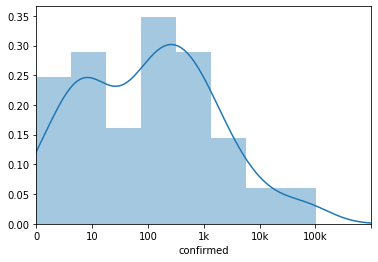

In [29]:
ax = sns.distplot(np.log10(country_df.query('date == "2020-03-27"')['confirmed'] + 1))
ax.set_xlim([0, 6])
ax.set_xticks(np.arange(7))
_ = ax.set_xticklabels(['0', '10', '100', '1k', '10k', '100k'])

It is difficult to see all countries so let's check top countries.

In [30]:
top_country_df = country_df.query('(date == @target_date) & (confirmed > 1000)').sort_values('confirmed', ascending=False)
top_country_melt_df = pd.melt(top_country_df, id_vars='country', value_vars=['confirmed', 'fatalities'])

Now **US, Italy and Spain** has more confirmed cases than China, and we can see many Europe countries in the top.

Korea also appears in relatively top despite of its population, this is because Korea execcutes inspection check aggressively.

In [31]:
fig = px.bar(top_country_melt_df.iloc[::-1],
             x='value', y='country', color='variable', barmode='group',
             title=f'Confirmed Cases/Deaths on {target_date}', text='value', height=1500, orientation='h')
fig.show()

Let's check these major country's growth by date.

As we can see, Coronavirus hit **China** at first but its trend is slowing down in March which is good news.<br/>
Bad news is 2nd wave comes to **Europe (Italy, Spain, Germany, France, UK)** at March.<br/>
But more sadly 3rd wave now comes to **US, whose growth rate is much much faster than China, or even Europe**. Its main spread starts from middle of March and its speed is faster than Italy. Now US seems to be in the most serious situation in terms of both total number and spread speed.<br/>


In [32]:
top30_countries = top_country_df.sort_values('confirmed', ascending=False).iloc[:30]['country'].unique()
top30_countries_df = country_df[country_df['country'].isin(top30_countries)]
fig = px.line(top30_countries_df,
              x='date', y='confirmed', color='country',
              title=f'Confirmed Cases for top 30 country as of {target_date}')
fig.show()

In terms of number of fatalities, Europe & US are serious situation now.<br/>
Many countries have more fatalities than China now, including US, Italy, Spain, France, UK, Iran Belgium, Germany, Brazil, Netherlands.

**US's spread speed is the fastest, US's fatality cases become top1 on Apr 10th.**

In [33]:
top30_countries = top_country_df.sort_values('fatalities', ascending=False).iloc[:30]['country'].unique()
top30_countries_df = country_df[country_df['country'].isin(top30_countries)]
fig = px.line(top30_countries_df,
              x='date', y='fatalities', color='country',
              title=f'Fatalities for top 30 country as of {target_date}')
fig.show()

Now let's see mortality rate by country

In [34]:
top_country_df = country_df.query('(date == @target_date) & (confirmed > 100)')
top_country_df['mortality_rate'] = top_country_df['fatalities'] / top_country_df['confirmed']
top_country_df = top_country_df.sort_values('mortality_rate', ascending=False)

Italy is the most serious situation, whose mortality rate is over 10% as of 2020/3/28.<br/>
We can also find countries from all over the world when we see top mortality rate countries.<br/>
Iran/Iraq from Middle East, Phillipines & Indonesia from tropical areas.<br/>
Spain, Netherlands, France, and UK form Europe etc. It shows this coronavirus is really world wide pandemic.

[UPDATE]: According to the comment by @elettra84, 10% of Italy is due to extreme outlier of Lombardy cluster. Except that mortality rate in Italy is comparable to other country. Refer [Lombardy cluster in wikipedia](https://en.wikipedia.org/wiki/2020_coronavirus_pandemic_in_Italy#Lombardy_cluster).

In [35]:
fig = px.bar(top_country_df[:30].iloc[::-1],
             x='mortality_rate', y='country',
             title=f'Mortality rate HIGH: top 30 countries on {target_date}', text='mortality_rate', height=800, orientation='h')
fig.show()

How about the countries whose mortality rate is low?

By investigating the difference between above & below countries, we might be able to figure out what is the cause which leads death.<br/>
Be careful that there may be a case that these country's mortality rate is low due to these country does not report/measure fatality cases properly.

In [36]:
fig = px.bar(top_country_df[-30:],
             x='mortality_rate', y='country',
             title=f'Mortality rate LOW: top 30 countries on {target_date}', text='mortality_rate', height=800, orientation='h')
fig.show()

Let's see number of confirmed cases on map. Again we can see Europe, US, MiddleEast (Turkey, Iran) and Asia (China, Korea) are red.

In [37]:
all_country_df = country_df.query('date == @target_date')
all_country_df['confirmed_log1p'] = np.log10(all_country_df['confirmed'] + 1)
all_country_df['fatalities_log1p'] = np.log10(all_country_df['fatalities'] + 1)
all_country_df['mortality_rate'] = all_country_df['fatalities'] / all_country_df['confirmed']

In [38]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="confirmed_log1p", 
                    hover_name="country", hover_data=["confirmed", 'fatalities', 'mortality_rate'],
                    range_color=[all_country_df['confirmed_log1p'].min(), all_country_df['confirmed_log1p'].max()], 
                    color_continuous_scale="peach", 
                    title='Countries with Confirmed Cases')

# I'd like to update colorbar to show raw values, but this does not work somehow...
# Please let me know if you know how to do this!!
trace1 = list(fig.select_traces())[0]
trace1.colorbar = go.choropleth.ColorBar(
    tickvals=[0, 1, 2, 3, 4, 5],
    ticktext=['1', '10', '100', '1000','10000', '10000'])
fig.show()

When we see mortality rate on map, we see Europe (especaiily Italy) is high. Also we notice MiddleEast (Iran, Iraq) is high.

When we see tropical area, I wonder why Phillipines and Indonesia are high while other countries (Malaysia, Thai, Vietnam, as well as Australia) are low.

For Asian region, Korea's mortality rate is lower than China or Japan, I guess this is due to the fact that number of inspection is quite many in Korea.
Please refer these blogs for detail:

 - [South Korea launches 'drive-thru' coronavirus testing facilities as demand soars](https://www.japantimes.co.jp/news/2020/03/01/asia-pacific/science-health-asia-pacific/south-korea-drive-thru-coronavirus/#.XoAmw4j7RPY)
 - [Coronavirus: Why Japan tested so few people](https://asia.nikkei.com/Spotlight/Coronavirus/Coronavirus-Why-Japan-tested-so-few-people)

In [39]:

fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="fatalities_log1p", 
                    hover_name="country", range_color=[0, 4],
                    hover_data=['confirmed', 'fatalities', 'mortality_rate'],
                    color_continuous_scale="peach", 
                    title='Countries with fatalities')
fig.show()

Mortality rate map, seems mortality rate is especially high in Europe region, compared to US or Asia.

In [41]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="mortality_rate", 
                    hover_name="country", range_color=[0, 0.12], 
                    color_continuous_scale="peach", 
                    title='Countries with mortality rate')
fig.show()

Why mortality rate is different among country? What kind of hint is hidden in this map? Especially mortality rate is high in Europe and US, is there some reasons?

There is one interesting hypothesis that BCG vaccination<br/>
The below figure shows BCG vaccination policy by country: Advanced countries like Europe & US, especially Italy and US does not take BCG vaccination. We can notice this map is indeed similar to mortality rate map above. Is it just accidental?

![](https://www.researchgate.net/profile/Alice_Zwerling/publication/50892386/figure/fig2/AS:277209752326147@1443103363144/Map-displaying-BCG-vaccination-policy-by-country-A-The-country-currently-has-universal.png)

Reference: [If I were North American/West European/Australian, I will take BCG vaccination now against the novel coronavirus pandemic.](https://www.jsatonotes.com/2020/03/if-i-were-north-americaneuropeanaustral.html)

 - [Australia's Trialing a TB Vaccine Against COVID-19, And Health Workers Get It First](https://www.sciencealert.com/australia-is-trialling-a-tb-vaccine-for-coronavirus-and-health-workers-get-it-first)

Of course this is just one hypothesis but we can notice/find some hints to tackle Coronavirus like this by carefully analyzing/comparing the data.

The figure showing fatality growth since 10 deaths.
 - Ref: [COVID-19 Deaths Per Capita](https://covid19dashboards.com/covid-compare-permillion/)

In [42]:
n_countries = 20
n_start_death = 10
fatality_top_countires = top_country_df.sort_values('fatalities', ascending=False).iloc[:n_countries]['country'].values
country_df['date'] = pd.to_datetime(country_df['date'])


df_list = []
for country in fatality_top_countires:
    this_country_df = country_df.query('country == @country')
    start_date = this_country_df.query('fatalities > @n_start_death')['date'].min()
    this_country_df = this_country_df.query('date >= @start_date')
    this_country_df['date_since'] = this_country_df['date'] - start_date
    this_country_df['fatalities_log1p'] = np.log10(this_country_df['fatalities'] + 1)
    this_country_df['fatalities_log1p'] -= this_country_df['fatalities_log1p'].values[0]
    df_list.append(this_country_df)

tmpdf = pd.concat(df_list)
tmpdf['date_since_days'] = tmpdf['date_since'] / pd.Timedelta('1 days')

In [43]:
fig = px.line(tmpdf,
              x='date_since_days', y='fatalities_log1p', color='country',
              title=f'Fatalities by country since 10 deaths, as of {target_date}')
fig.add_trace(go.Scatter(x=[0, 21], y=[0, 3], name='Double by 7 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.add_trace(go.Scatter(x=[0, 42], y=[0, 3], name='Double by 14 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.add_trace(go.Scatter(x=[0, 63], y=[0, 3], name='Double by 21 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.show()

Sudden increase at China on the days 85 may be because updated reporting in Wuhan:

 - [Coronavirus: China outbreak city Wuhan raises death toll by 50%](https://www.bbc.com/news/world-asia-china-52321529)

## Daily NEW confirmed cases trend

How about **DAILY new cases** trend?<br/>
We find from below figure:
 - China has finished its peak at Feb 14, new confirmed cases are surpressed now.
 - Europe&US spread starts on mid of March, after China slows down.
 - I feel effect of lock down policy in Europe (Italy, Spain, Germany, France) now comes on the figure,
   the number of new cases are not so increasing rapidly at the end of March.
 - Current US new confirmed cases are the worst speed, recording worst speed at more than 30k people/day at peak. <b>Daily new confirmed cases start to decrease from April 4 or April 10, I hope this trend will continue.</b>.
   - <span style="color:red"><b>After that we can see a weekly trend that the confirmed cases becomes small on Monday. I think this is because people don't (or cannot) get medical care on Sunday so its reporting number is low on Sunday or Monday</b></span>

In [44]:
country_df['prev_confirmed'] = country_df.groupby('country')['confirmed'].shift(1)
country_df['new_case'] = country_df['confirmed'] - country_df['prev_confirmed']
country_df['new_case'].fillna(0, inplace=True)
top30_country_df = country_df[country_df['country'].isin(top30_countries)]

fig = px.line(top30_country_df,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases world wide')
fig.show()

## Geographical animation: spready by date

You can see animation how confirmed cases spread over time, you can see trend moving to China -> Europe -> US.

In [45]:
country_df['date'] = country_df['date'].apply(str)
country_df['confirmed_log1p'] = np.log1p(country_df['confirmed'])
country_df['fatalities_log1p'] = np.log1p(country_df['fatalities'])

fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="confirmed", size='confirmed', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['confirmed'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Confirmed cases spread Over Time', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig.show()

You can see animation how confirmed cases spread over time, you can see trend moving to China -> Europe -> US. But Europe is worse than US for number of fatalities now.

In [46]:
fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="fatalities", size='fatalities', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['fatalities'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Fatalities growth Over Time', color_continuous_scale="portland")
fig.show()

New cases trend: it looks like China is almost converged now.

In [47]:
country_df.loc[country_df['new_case'] < 0, 'new_case'] = 0.
fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="new_case", size='new_case', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['new_case'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Daily NEW cases over Time', color_continuous_scale="portland")
fig.show()

<a id="id_province"></a>
# Going into province

How many country has precise province information?<br/>
It seems it's 8 countries: Australia, Canada, China, Denmark, France, Netherlands, US, and UK.

In [48]:
for country in countries:
    province = train.query('country == @country')['province'].unique()
    if len(province) > 1:       
        print(f'Country {country} has {len(province)} provinces: {province}')

Country Australia has 8 provinces: ['Australian Capital Territory' 'New South Wales' 'Northern Territory'
 'Queensland' 'South Australia' 'Tasmania' 'Victoria' 'Western Australia']
Country Canada has 12 provinces: ['Alberta' 'British Columbia' 'Manitoba' 'New Brunswick'
 'Newfoundland and Labrador' 'Nova Scotia' 'Ontario'
 'Prince Edward Island' 'Quebec' 'Saskatchewan' 'Northwest Territories'
 'Yukon']
Country China has 33 provinces: ['Anhui' 'Beijing' 'Chongqing' 'Fujian' 'Gansu' 'Guangdong' 'Guangxi'
 'Guizhou' 'Hainan' 'Hebei' 'Heilongjiang' 'Henan' 'Hong Kong' 'Hubei'
 'Hunan' 'Inner Mongolia' 'Jiangsu' 'Jiangxi' 'Jilin' 'Liaoning' 'Macau'
 'Ningxia' 'Qinghai' 'Shaanxi' 'Shandong' 'Shanghai' 'Shanxi' 'Sichuan'
 'Tianjin' 'Tibet' 'Xinjiang' 'Yunnan' 'Zhejiang']
Country Denmark has 3 provinces: ['Faroe Islands' 'Greenland' nan]
Country France has 11 provinces: ['French Guiana' 'French Polynesia' 'Guadeloupe' 'Mayotte' 'New Caledonia'
 'Reunion' 'Saint Barthelemy' 'St Martin' 'Martini

<a id="id_us"></a>
# Zoom up to US: what is happening in US now??

As we can see, the spread is fastest in US now, at the end of March. Let's see in detail what is going on in US.

In [52]:
usa_state_code_df = pd.read_csv('usa_states2.csv')
usa_state_code_df

,state_name,state_code
0,Alabama,AL
1,Alaska,AK
2,American Samoa,AS
3,Arizona,AZ
4,Arkansas,AR
5,California,CA
6,Colorado,CO
7,Connecticut,CT
8,Delaware,DE
9,District of Columbia,DC


In [53]:
train_us

,country,province,date,confirmed,fatalities,country_province
0,US,Alabama,2020-01-22,0,0,US/Alabama
1,US,Alaska,2020-01-22,0,0,US/Alaska
2,US,Arizona,2020-01-22,0,0,US/Arizona
3,US,Arkansas,2020-01-22,0,0,US/Arkansas
4,US,California,2020-01-22,0,0,US/California
...,...,...,...,...,...,...
6151,US,Virginia,2020-05-14,27813,956,US/Virginia
6152,US,Washington,2020-05-14,17773,983,US/Washington
6153,US,West Virginia,2020-05-14,1427,60,US/West Virginia
6154,US,Wisconsin,2020-05-14,11275,434,US/Wisconsin


In [54]:
# Prepare data frame only for US. 

#train_us = train.query('country == "US"')
train_us['mortality_rate'] = train_us['fatalities'] / train_us['confirmed']

# Convert province column to its 2-char code name,
state_name_to_code = dict(zip(usa_state_code_df['state_name'], usa_state_code_df['state_code']))
train_us['province_code'] = train_us['province'].map(state_name_to_code)

# Only show latest days.
train_us_latest = train_us.query('date == @target_date')

When we see inside of the US, we can see **only New York, and its neighbor New Jersey** dominates its spread and are in serious situation.

New York confirmed cases is over 50k, while other states are less than about 5k confirmed cases.

In [55]:
fig = px.choropleth(train_us_latest, locations='province_code', locationmode="USA-states",
                    color='confirmed', scope="usa", hover_data=['province', 'fatalities', 'mortality_rate'],
                    title=f'Confirmed cases in US on {target_date}')
fig.show()

Mortality rate in New York seems not high, around 2% for now.

In [56]:
train_us_latest.sort_values('confirmed', ascending=False)

,country,province,date,confirmed,fatalities,country_province,mortality_rate,province_code
6135,US,New York,2020-05-14,343051,27641,US/New York,0.080574,NY
6133,US,New Jersey,2020-05-14,142704,9946,US/New Jersey,0.069697,NJ
6116,US,Illinois,2020-05-14,87937,3928,US/Illinois,0.044668,IL
6124,US,Massachusetts,2020-05-14,82182,5482,US/Massachusetts,0.066706,MA
6106,US,California,2020-05-14,74871,3052,US/California,0.040763,CA
6141,US,Pennsylvania,2020-05-14,63105,4288,US/Pennsylvania,0.067950,PA
6125,US,Michigan,2020-05-14,49582,4787,US/Michigan,0.096547,MI
6147,US,Texas,2020-05-14,44480,1235,US/Texas,0.027765,TX
6111,US,Florida,2020-05-14,43210,1875,US/Florida,0.043393,FL
6112,US,Georgia,2020-05-14,35977,1545,US/Georgia,0.042944,GA


In [57]:
fig = px.choropleth(train_us_latest, locations='province_code', locationmode="USA-states",
                    color='mortality_rate', scope="usa", hover_data=['province', 'fatalities', 'mortality_rate'],
                    title=f'Mortality rate in US on {target_date}')
fig.show()

**Daily growth**: All state is US got affected from middle of March, and now **growing exponentially**.
In New York, less than 1k people are confirmed on March 16, but more than 50k people are confirmed on March 30. **50 times explosion in 2 weeks!**

In [58]:
train_us_march = train_us.query('date > "2020-03-01"')
fig = px.line(train_us_march,
              x='date', y='confirmed', color='province',
              title=f'Confirmed cases by state in US, as of {target_date}')
fig.show()

<a id="id_europe"></a>
# Europe

In [59]:
# Ref: https://www.kaggle.com/abhinand05/covid-19-digging-a-bit-deeper
europe_country_list =list([
    'Austria','Belgium','Bulgaria','Croatia','Cyprus','Czechia','Denmark','Estonia','Finland','France','Germany','Greece','Hungary','Ireland',
    'Italy', 'Latvia','Luxembourg','Lithuania','Malta','Norway','Netherlands','Poland','Portugal','Romania','Slovakia','Slovenia',
    'Spain', 'Sweden', 'United Kingdom', 'Iceland', 'Russia', 'Switzerland', 'Serbia', 'Ukraine', 'Belarus',
    'Albania', 'Bosnia and Herzegovina', 'Kosovo', 'Moldova', 'Montenegro', 'North Macedonia'])

country_df['date'] = pd.to_datetime(country_df['date'])
train_europe = country_df[country_df['country'].isin(europe_country_list)]
#train_europe['date_str'] = pd.to_datetime(train_europe['date'])
train_europe_latest = train_europe.query('date == @target_date')

When we look into the Europe, its Northern & Eastern areas are relatively better situation compared to Eastern & Southern areas.

In [60]:
fig = px.choropleth(train_europe_latest, locations="country", 
                    locationmode='country names', color="confirmed", 
                    hover_name="country", range_color=[1, train_europe_latest['confirmed'].max()], 
                    color_continuous_scale='portland', 
                    title=f'European Countries with Confirmed Cases as of {target_date}', scope='europe', height=800)
fig.show()

Especially **Italy, Spain, German, France, UK** are in more serious situation.

Number of confirmed cases rapidly increasing in **Russia now (as of May 1)**, **Russia** is now potentially very dangerous situation.

In [61]:
train_europe_march = train_europe.query('date >= "2020-03-01"')
fig = px.line(train_europe_march,
              x='date', y='confirmed', color='country',
              title=f'Confirmed cases by country in Europe, as of {target_date}')
fig.show()

In [62]:
fig = px.line(train_europe_march,
              x='date', y='fatalities', color='country',
              title=f'Fatalities by country in Europe, as of {target_date}')
fig.show()

When we check daily new cases in Europe, we notice:

 - **UK and Russia** daily growth are more than Italy now, These countries are potentially more dangerous now.
 - Italy new cases are not increasing since March 21, I guess due to lock-down policy is started working. That is not a bad news.

In [63]:
train_europe_march['prev_confirmed'] = train_europe_march.groupby('country')['confirmed'].shift(1)
train_europe_march['new_case'] = train_europe_march['confirmed'] - train_europe_march['prev_confirmed']
fig = px.line(train_europe_march,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases by country in Europe')
fig.show()

<a id="id_asia"></a>
# Asia

In Asia, China & Iran have many confirmed cases, followed by South Korea & Turkey. 

In [64]:
country_latest = country_df.query('date == @target_date')

fig = px.choropleth(country_latest, locations="country", 
                    locationmode='country names', color="confirmed", 
                    hover_name="country", range_color=[1, 50000], 
                    color_continuous_scale='portland', 
                    title=f'Asian Countries with Confirmed Cases as of {target_date}', scope='asia', height=800)
fig.show()

The coronavirus hit Asia in early phase, how is the situation now?<br/>
China & Korea is already in decreasing phase.<br/>

Unlike China or Korea, daily new confirmed cases were kept increasing on March or April, especially in Iran or Japan. But the number is started to decrease now on these country as well now.

In [65]:
top_asian_country_df = country_df[country_df['country'].isin(['China', 'Indonesia', 'Iran', 'Japan', 'Korea, South', 'Malaysia', 'Philippines'])]

fig = px.line(top_asian_country_df,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases world wide')
fig.show()

<a id="id_recover"></a>
# Which country is recovering now?

We saw that Coronavirus now hits Europe & US, in serious situation. How does it converge?

We can refer other country where confirmed cases is already decreasing.<br/>
Here I defined `new_case_peak_to_now_ratio`, as a ratio of current new case and the max new case for each country.<br/>
If new confirmed case is biggest now, its ratio is 1.
Its ratio is expected to be low value for the countries where the peak has already finished.  

In [66]:
max_confirmed = country_df.groupby('country')['new_case'].max().reset_index()
country_latest = pd.merge(country_latest, max_confirmed.rename({'new_case': 'max_new_case'}, axis=1))
country_latest['new_case_peak_to_now_ratio'] = country_latest['new_case'] / country_latest['max_new_case']

In [67]:
recovering_country = country_latest.query('new_case_peak_to_now_ratio < 0.5')
major_recovering_country = recovering_country.query('confirmed > 100')

The ratio is 0 for the country with very few confirmed cases are reported.<br/>
I choosed the countries with its confirmed cases more than 100, to see only major countries with the ratio is low.

We can see:
 - Middle East coutnries.
 - South Africa countries.
 - China & Korea from Asia.

In [68]:
fig = px.bar(major_recovering_country.sort_values('new_case_peak_to_now_ratio', ascending=False),
             x='new_case_peak_to_now_ratio', y='country',
             title=f'Mortality rate LOW: top 30 countries on {target_date}', text='new_case_peak_to_now_ratio', height=1000, orientation='h')
fig.show()

Let's see by map. Yellow countries have high ratio, currently increasing countries. **Blue & purple countries** have low ratio, already decreasing countries from its peak.

In [69]:
fig = px.choropleth(country_latest, locations="country", 
                    locationmode='country names', color="new_case_peak_to_now_ratio", 
                    hover_name="country", range_color=[0, 1], 
                    # color_continuous_scale="peach", 
                    hover_data=['confirmed', 'fatalities', 'new_case', 'max_new_case'],
                    title='Countries with new_case_peak_to_now_ratio')
fig.show()

Let's see some recovering countries.

## China

When we check each state stats, we can see Hubei, the starting place, is extremely large number of confirmed cases.<br/>
Other states records actually few confirmed cases compared to Hubei.

In [70]:
china_df = train.query('country == "China"')
china_df['prev_confirmed'] = china_df.groupby('province')['confirmed'].shift(1)
china_df['new_case'] = china_df['confirmed'] - china_df['prev_confirmed']
china_df.loc[china_df['new_case'] < 0, 'new_case'] = 0.

In [71]:
fig = px.line(china_df,
              x='date', y='new_case', color='province',
              title=f'DAILY NEW Confirmed cases in China by province')
fig.show()

## The situation of Hubei now?

Hubei record its new case peak on Feb 14. And finally, new case was not found on March 19.

To become no new case found, it took **about 2month after confirmed cases occured**, and **1 month after the peak has reached.** <br/>
This term will be the reference for other country to how long we must lock-down the city.

The anomally number of 325 on Apr 17 is maybe due to the news that China admits the reporting number was low, so its number is not fatalities on this date, but past fatalities with not reported until now.

In [72]:
china_df.query('(province == "Hubei") & (date > "2020-03-10")')[['country_province', 'date', 'confirmed', 'fatalities', 'recovered', 'new_case']]

,country_province,date,confirmed,fatalities,recovered,new_case
12948,China/Hubei,2020-03-11,67773,3046,3046.0,13.0
13211,China/Hubei,2020-03-12,67781,3056,3056.0,8.0
13474,China/Hubei,2020-03-13,67786,3062,3062.0,5.0
13737,China/Hubei,2020-03-14,67790,3075,3075.0,4.0
14000,China/Hubei,2020-03-15,67794,3085,3085.0,4.0
...,...,...,...,...,...,...
28728,China/Hubei,2020-05-10,68134,4512,4512.0,5.0
28991,China/Hubei,2020-05-11,68134,4512,4512.0,0.0
29254,China/Hubei,2020-05-12,68134,4512,4512.0,0.0
29517,China/Hubei,2020-05-13,68134,4512,4512.0,0.0


<a id="id_converge"></a>
# When will it converge? - Estimation by sigmoid fitting

I guess everyone is wondering when the coronavirus converges. Let's estimate it roughly using sigmoid fitting.<br/>
I referenced below kernels for original ideas.

 - [Sigmoid per country](https://www.kaggle.com/group16/sigmoid-per-country-no-leakage) by @group16
 - [COVID-19 growth rates per country](https://www.kaggle.com/mikestubna/covid-19-growth-rates-per-country) by @mikestubna

In [73]:
def sigmoid(t, M, beta, alpha, offset=0):
    alpha += offset
    return M / (1 + np.exp(-beta * (t - alpha)))

def error(x, y, params):
    M, beta, alpha = params
    y_pred = sigmoid(x, M, beta, alpha)

    # apply weight, latest number is more important than past.
    weight = np.arange(len(y_pred)) ** 2
    loss_mse = np.mean((y_pred - y) ** 2 * weight)
    return loss_mse

def gen_random_color(min_value=0, max_value=256) -> str:
    """Generate random color for plotly"""
    r, g, b = np.random.randint(min_value, max_value, 3)
    return f'rgb({r},{g},{b})'

In [65]:
def fit_sigmoid(exclude_days=0):
    target_country_df_list = []
    pred_df_list = []
    for target_country in top30_countries:
        print('target_country', target_country)
        # --- Train ---
        target_country_df = country_df.query('country == @target_country')

        #train_start_date = target_country_df['date'].min()
        train_start_date = target_country_df.query('confirmed > 1000')['date'].min()
        train_end_date = pd.to_datetime(target_date) - pd.Timedelta(f'{exclude_days} days')
        target_date_df = target_country_df.query('(date >= @train_start_date) & (date <= @train_end_date)')
        if len(target_date_df) <= 7:
            print('WARNING: the data is not enough, use 7 more days...')
            train_start_date -= pd.Timedelta('7 days')
            target_date_df = target_country_df.query('(date >= @train_start_date) & (date <= @train_end_date)')

        confirmed = target_date_df['confirmed'].values
        x = np.arange(len(confirmed))

        lossfun = lambda params: error(x, confirmed, params)
        res = sp.optimize.minimize(lossfun, x0=[np.max(confirmed) * 5, 0.04, 2 * len(confirmed) / 3.], method='nelder-mead')
        M, beta, alpha = res.x
        # sigmoid_models[key] = (M, beta, alpha)
        # np.clip(sigmoid(list(range(len(data), len(data) + steps)), M, beta, alpha), 0, None).astype(int)

        # --- Pred ---
        pred_start_date = target_country_df['date'].min()
        pred_end_date = pd.to_datetime('2020-07-01')
        days = int((pred_end_date - pred_start_date) / pd.Timedelta('1 days'))
        # print('pred start', pred_start_date, 'end', pred_end_date, 'days', days)

        x = np.arange(days)
        offset = (train_start_date - pred_start_date) / pd.Timedelta('1 days')
        print('train_start_date', train_start_date, 'offset', offset, 'params', M, beta, alpha)
        y_pred = sigmoid(x, M, beta, alpha, offset=offset)
        # target_country_df['confirmed_pred'] = y_pred

        all_dates = [pred_start_date + np.timedelta64(x, 'D') for x in range(days)]
        pred_df = pd.DataFrame({
            'date': all_dates,
            'country': target_country,
            'confirmed_pred': y_pred,
        })

        target_country_df_list.append(target_country_df)
        pred_df_list.append(pred_df)
    return target_country_df_list, pred_df_list

In [66]:
def plot_sigmoid_fitting(target_country_df_list, pred_df_list, title=''):
    n_countries = len(top30_countries)

    # --- Plot ---
    fig = go.Figure()

    for i in range(n_countries):
        target_country = top30_countries[i]
        target_country_df = target_country_df_list[i]
        pred_df = pred_df_list[i]
        color = gen_random_color(min_value=20)
        # Prediction
        fig.add_trace(go.Scatter(
            x=pred_df['date'], y=pred_df['confirmed_pred'],
            name=f'{target_country}_pred',
            line=dict(color=color, dash='dash')
        ))

        # Ground truth
        fig.add_trace(go.Scatter(
            x=target_country_df['date'], y=target_country_df['confirmed'],
            mode='markers', name=f'{target_country}_actual',
            line=dict(color=color),
        ))
    fig.update_layout(
        title=title, xaxis_title='Date', yaxis_title='Confirmed cases')
    fig.show()

In [67]:
target_country_df_list, pred_df_list = fit_sigmoid(exclude_days=0)

target_country US
train_start_date 2020-03-11 00:00:00 offset 49.0 params 1425500.4319266407 0.09322916275347332 37.774700069270125
target_country United Kingdom
train_start_date 2020-03-14 00:00:00 offset 52.0 params 232165.19385784696 0.09676555037670817 35.525553557440176
target_country Italy
train_start_date 2020-02-29 00:00:00 offset 38.0 params 224024.0880679515 0.08570727792733089 33.268114384604075
target_country Spain
train_start_date 2020-03-09 00:00:00 offset 47.0 params 220656.4027775601 0.12745510058007814 24.57382362811282
target_country France
train_start_date 2020-03-08 00:00:00 offset 46.0 params 173884.89394612153 0.14947067333107822 30.196507651249362
target_country Belgium
train_start_date 2020-03-16 00:00:00 offset 54.0 params 54124.61146782389 0.11029765641729128 25.570179275138365
target_country Brazil
train_start_date 2020-03-21 00:00:00 offset 59.0 params 345973.975370623 0.08836683469440597 52.76182125142098
target_country Germany
train_start_date 2020-03-08 0

In [68]:
plot_sigmoid_fitting(target_country_df_list, pred_df_list, title='Sigmoid fitting with all latest data')

If we believe above curve, confirmed cases is slowing down now and it will be converging **around the beginning of May** in most of the country. It might take until beginning on June in US.

However I'm not confident how this sigmoid fitting is accurate, it's just an estimation by some modeling.<br/>
Let's try validation by excluding last 7 days data.

In [69]:
target_country_df_list, pred_df_list = fit_sigmoid(exclude_days=7)

target_country US
train_start_date 2020-03-11 00:00:00 offset 49.0 params 1210127.0611436954 0.11096020765998445 34.062759717900136
target_country United Kingdom
train_start_date 2020-03-14 00:00:00 offset 52.0 params 192537.9123823942 0.11901186851058201 31.491729908376133
target_country Italy
train_start_date 2020-02-29 00:00:00 offset 38.0 params 215533.51655148703 0.09241912431681401 32.245289725847854
target_country Spain
train_start_date 2020-03-09 00:00:00 offset 47.0 params 218553.34651930566 0.13110371745968402 24.406469830606184
target_country France
train_start_date 2020-03-08 00:00:00 offset 46.0 params 178055.00686930266 0.1420947857424763 30.593147976363145
target_country Belgium
train_start_date 2020-03-16 00:00:00 offset 54.0 params 54580.78946069316 0.10870726866814177 25.747926492279788
target_country Brazil
train_start_date 2020-03-21 00:00:00 offset 59.0 params 374960.49181588215 0.08475628334045343 54.84214118897205
target_country Germany
train_start_date 2020-03-0

In [70]:
plot_sigmoid_fitting(target_country_df_list, pred_df_list, title='Sigmoid fitting without last 7days data')